In [1]:
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from scipy.stats import bootstrap

In [2]:
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

sns.set(style="whitegrid")

warnings.filterwarnings('ignore')

[1] Используя make_blobs с любым random_state,
сгенерировать датасет df, в котором есть три класса с размером каждого класса
100, четыре количественных (недискретных) признака ,а центры классов
зафиксированы в следующих точках: Класс 0 – (+1, +1, +1, +1), Класс 1 – (-1,-1,-1,-
1), Класс 2 – (-1,+1,-1,+1).

In [3]:
# Параметры генерации
centers = [(1, 1, 1, 1), (-1, -1, -1, -1), (-1, 1, -1, 1)]
X, y = make_blobs(n_samples=300, centers=centers, n_features=4, random_state=42)

# Создаем DataFrame
df = pd.DataFrame(X, columns=['feature_1', 'feature_2', 'feature_3', 'feature_4'])
df['class'] = y

print(df.head())

   feature_1  feature_2  feature_3  feature_4  class
0  -0.591747  -2.702584   0.029156  -0.527403      1
1   0.410635   1.849602   1.357015   0.307090      0
2  -0.354624   0.368632  -1.964923  -0.313949      1
3  -0.405246   1.853416  -0.241071   1.281191      2
4  -3.471645  -1.796895  -0.422928  -1.203045      1


In [4]:
def show_datasets_stats(df, description=True, corr_matrix=True, pairplot=True, pair_plot_size=2) -> None:
    if description is True:
        print("------------------------Key df characteristics------------------------")
        print(df.describe())
        print(df['class'].value_counts())

    if corr_matrix is True:
        print("------------------------Corellation matrix------------------------")
        sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
        plt.title("Correlation Matrix")
        plt.show()

    if pairplot is True:
        print("------------------------feauture-pair vizualization------------------------")
        sns.pairplot(df, hue='class', height=pair_plot_size, plot_kws={'alpha': 0.8, 'edgecolor': 'black', 'linewidth': 0.1})
        plt.show()

[2] Не забываем повторять шаги с задания 1
- ключевые характеристики датасета, корреляции, визуализация на всех парах var

------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  300.000000  300.000000  300.000000  300.000000  300.000000
mean    -0.290793    0.347177   -0.279180    0.376324    1.000000
std      1.302909    1.424841    1.359680    1.383420    0.817861
min     -3.650970   -2.804882   -3.696887   -3.301921    0.000000
25%     -1.232938   -0.567018   -1.250467   -0.548240    0.000000
50%     -0.372631    0.490000   -0.404749    0.459384    1.000000
75%      0.599307    1.342490    0.697384    1.422482    2.000000
max      3.314659    4.852731    3.189803    3.720169    2.000000
class
1    100
0    100
2    100
Name: count, dtype: int64
------------------------Corellation matrix------------------------


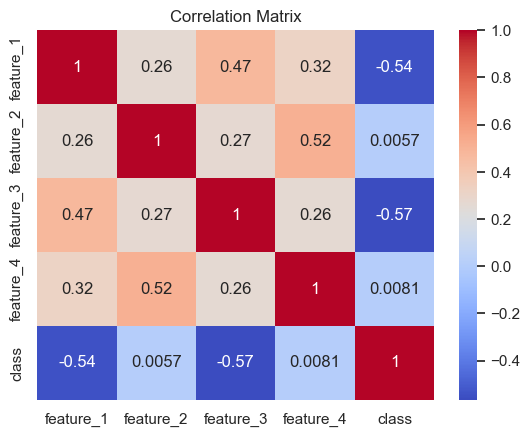

------------------------feauture-pair vizualization------------------------


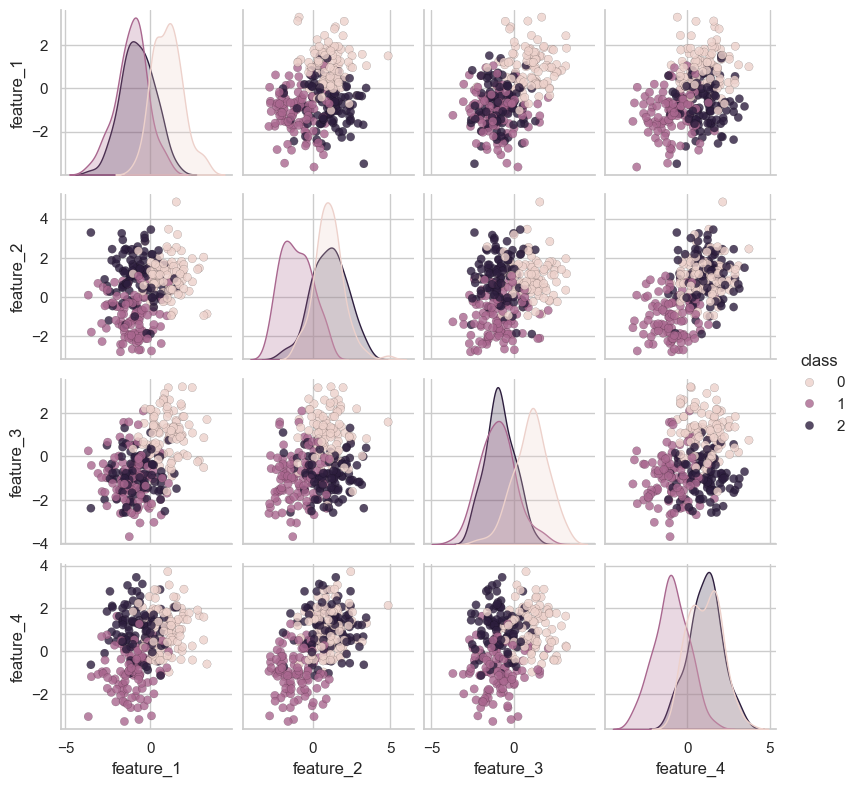

In [5]:
show_datasets_stats(df)

[3] На основе созданного в пункте [1] датасета сгенерировать отдельные
дополнительные датасеты (df_A_B), в которых к классу 0 добавлено A одинаковых
точек с координатами (+B,-B,+B,-B), где A = 1, 10, 100 и B = 5, 10, 20, при этом
количество объектов в остальных классах неизменно.

------------------------Dataset with A=1, B=5 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  301.000000  301.000000  301.000000  301.000000  301.000000
mean    -0.273215    0.329412   -0.261641    0.358463    0.996678
std      1.336006    1.455471    1.391099    1.415451    0.818529
min     -3.650970   -5.000000   -3.696887   -5.000000    0.000000
25%     -1.230935   -0.600864   -1.248964   -0.570501    0.000000
50%     -0.367592    0.483955   -0.402600    0.444523    1.000000
75%      0.613711    1.341152    0.735343    1.421921    2.000000
max      5.000000    4.852731    5.000000    3.720169    2.000000
class
0    101
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


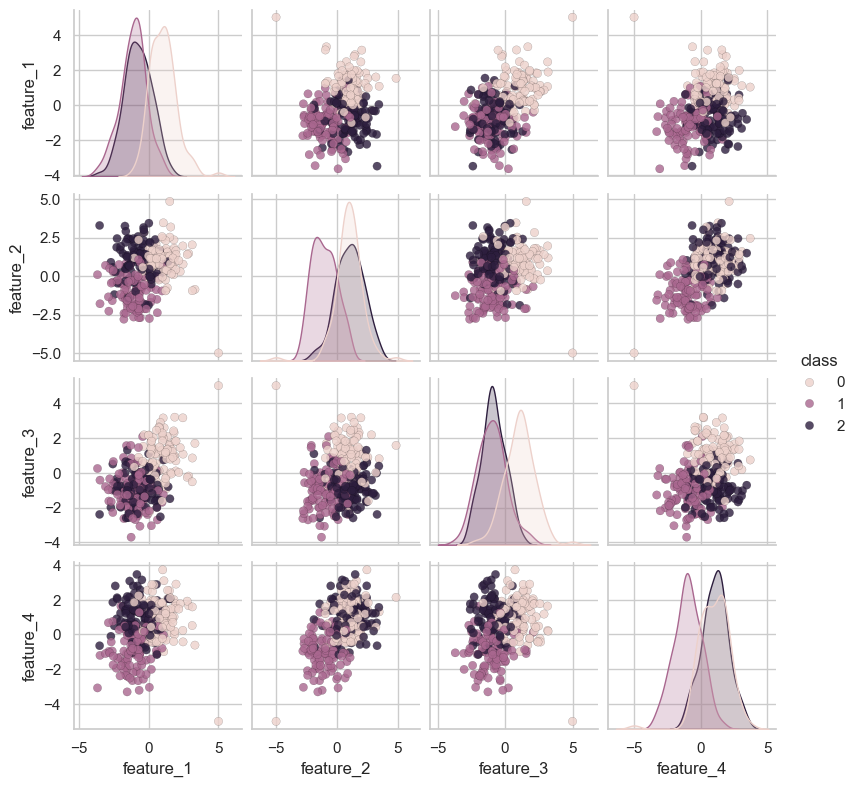

------------------------Dataset with A=1, B=10 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  301.000000  301.000000  301.000000  301.000000  301.000000
mean    -0.256604    0.312801   -0.245030    0.341852    0.996678
std      1.429595    1.542433    1.481081    1.505049    0.818529
min     -3.650970  -10.000000   -3.696887  -10.000000    0.000000
25%     -1.230935   -0.600864   -1.248964   -0.570501    0.000000
50%     -0.367592    0.483955   -0.402600    0.444523    1.000000
75%      0.613711    1.341152    0.735343    1.421921    2.000000
max     10.000000    4.852731   10.000000    3.720169    2.000000
class
0    101
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


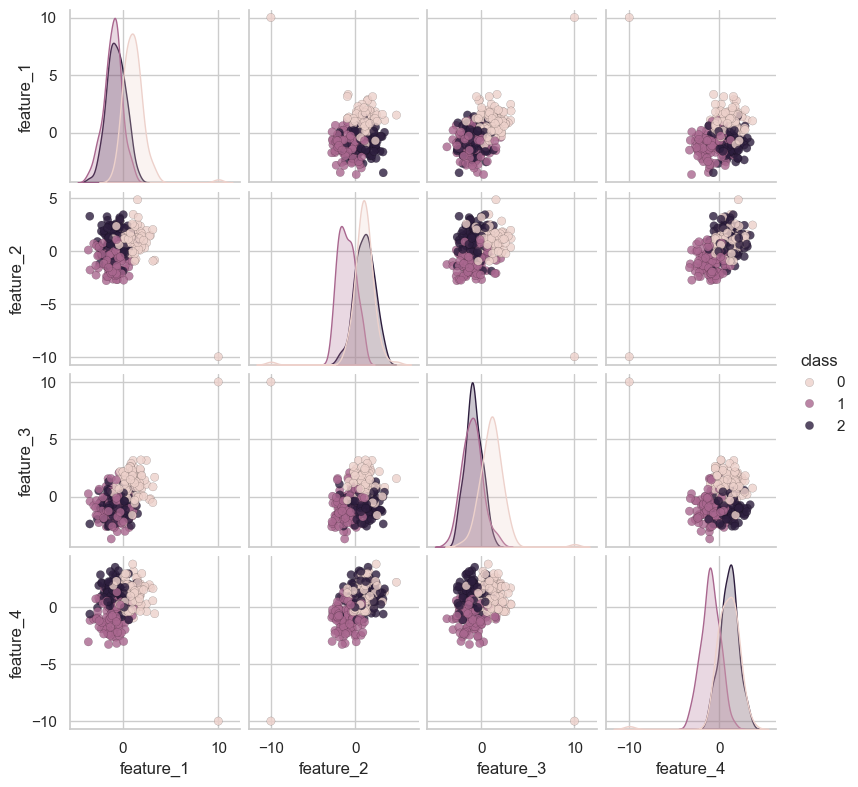

------------------------Dataset with A=1, B=20 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  301.000000  301.000000  301.000000  301.000000  301.000000
mean    -0.223382    0.279578   -0.211807    0.308629    0.996678
std      1.749212    1.843596    1.791320    1.812969    0.818529
min     -3.650970  -20.000000   -3.696887  -20.000000    0.000000
25%     -1.230935   -0.600864   -1.248964   -0.570501    0.000000
50%     -0.367592    0.483955   -0.402600    0.444523    1.000000
75%      0.613711    1.341152    0.735343    1.421921    2.000000
max     20.000000    4.852731   20.000000    3.720169    2.000000
class
0    101
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


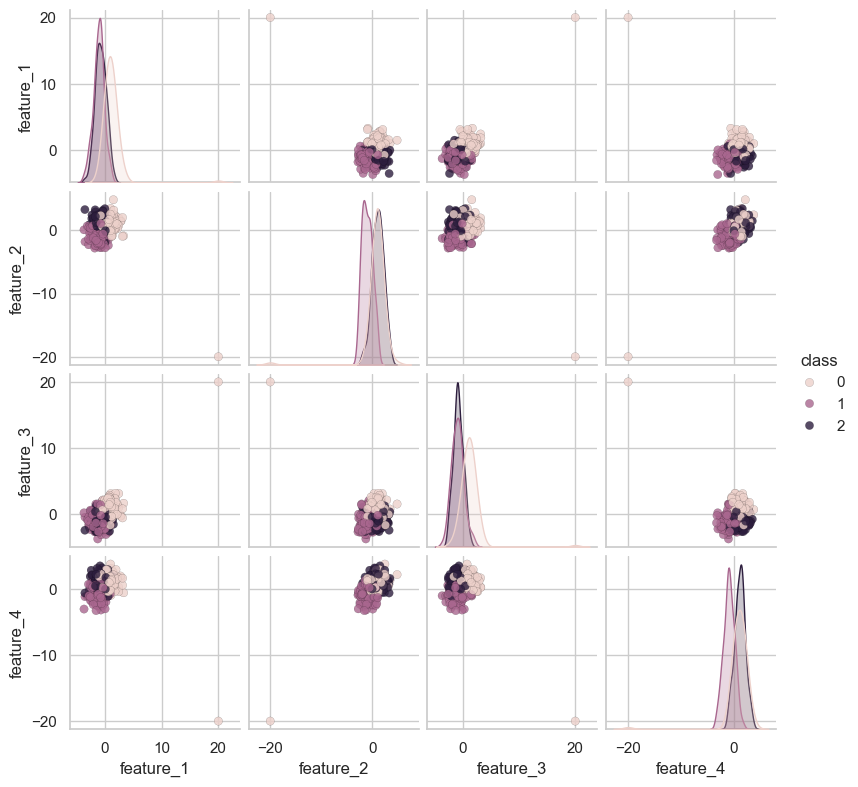

------------------------Dataset with A=10, B=5 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  310.000000  310.000000  310.000000  310.000000  310.000000
mean    -0.120122    0.174687   -0.108884    0.202895    0.967742
std      1.587236    1.691135    1.631483    1.660473    0.823752
min     -3.650970   -5.000000   -3.696887   -5.000000    0.000000
25%     -1.172961   -0.841065   -1.241008   -0.721931    0.000000
50%     -0.330844    0.433059   -0.364313    0.434812    1.000000
75%      0.752817    1.318398    0.873757    1.393182    2.000000
max      5.000000    4.852731    5.000000    3.720169    2.000000
class
0    110
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


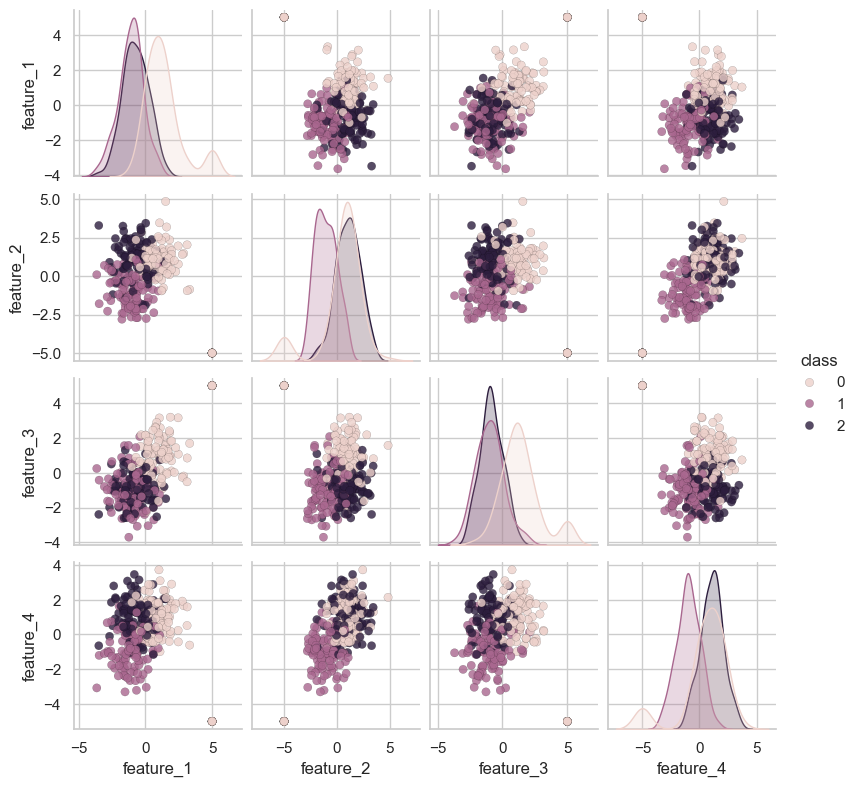

------------------------Dataset with A=10, B=10 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  310.000000  310.000000  310.000000  310.000000  310.000000
mean     0.041168    0.013397    0.052407    0.041604    0.967742
std      2.226944    2.305983    2.257889    2.285589    0.823752
min     -3.650970  -10.000000   -3.696887  -10.000000    0.000000
25%     -1.172961   -0.841065   -1.241008   -0.721931    0.000000
50%     -0.330844    0.433059   -0.364313    0.434812    1.000000
75%      0.752817    1.318398    0.873757    1.393182    2.000000
max     10.000000    4.852731   10.000000    3.720169    2.000000
class
0    110
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


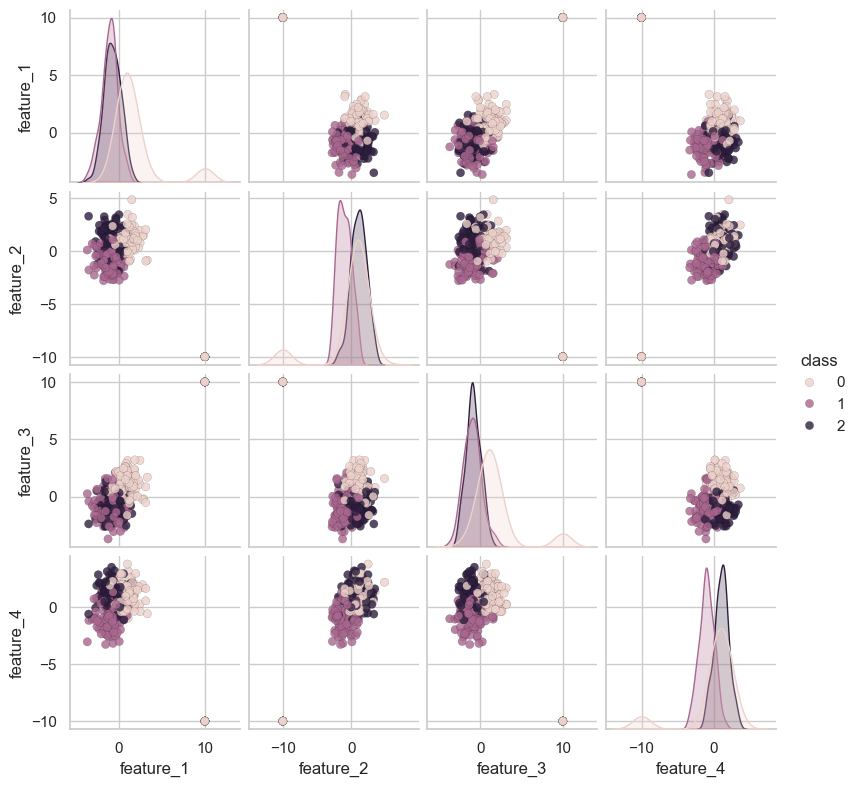

------------------------Dataset with A=10, B=20 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  310.000000  310.000000  310.000000  310.000000  310.000000
mean     0.363749   -0.309184    0.374987   -0.280976    0.967742
std      3.812738    3.864010    3.829946    3.854243    0.823752
min     -3.650970  -20.000000   -3.696887  -20.000000    0.000000
25%     -1.172961   -0.841065   -1.241008   -0.721931    0.000000
50%     -0.330844    0.433059   -0.364313    0.434812    1.000000
75%      0.752817    1.318398    0.873757    1.393182    2.000000
max     20.000000    4.852731   20.000000    3.720169    2.000000
class
0    110
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


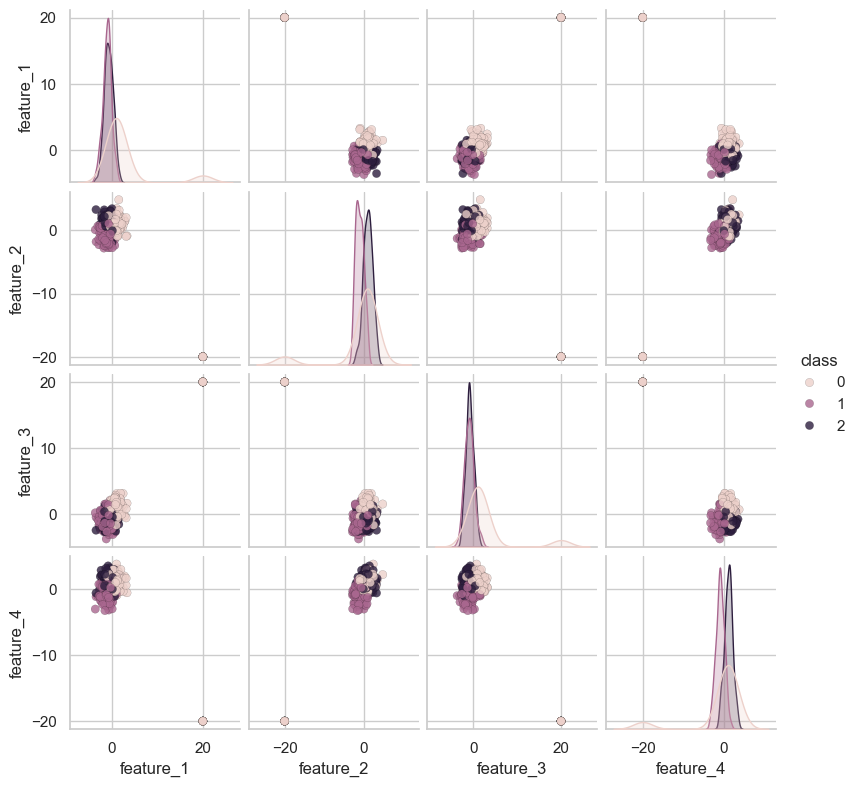

------------------------Dataset with A=100, B=5 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  400.000000  400.000000  400.000000  400.000000  400.000000
mean     1.031905   -0.989617    1.040615   -0.967757    0.750000
std      2.556142    2.625995    2.573725    2.620579    0.830195
min     -3.650970   -5.000000   -3.696887   -5.000000    0.000000
25%     -0.922768   -3.353662   -0.981570   -3.726441    0.000000
50%      0.221961   -0.220898    0.226297   -0.240154    0.500000
75%      3.735994    1.057810    3.642352    1.194783    1.250000
max      5.000000    4.852731    5.000000    3.720169    2.000000
class
0    200
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


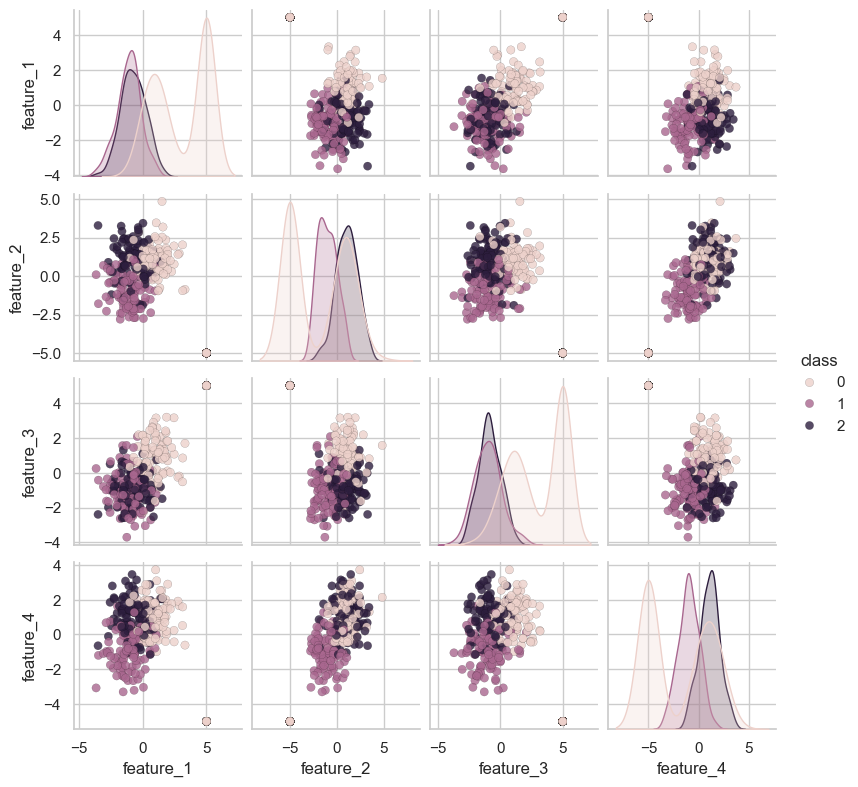

------------------------Dataset with A=100, B=10 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  400.000000  400.000000  400.000000  400.000000  400.000000
mean     2.281905   -2.239617    2.290615   -2.217757    0.750000
std      4.601979    4.652546    4.609401    4.655379    0.830195
min     -3.650970  -10.000000   -3.696887  -10.000000    0.000000
25%     -0.922768   -4.603662   -0.981570   -4.976441    0.000000
50%      0.221961   -0.220898    0.226297   -0.240154    0.500000
75%      4.985994    1.057810    4.892352    1.194783    1.250000
max     10.000000    4.852731   10.000000    3.720169    2.000000
class
0    200
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


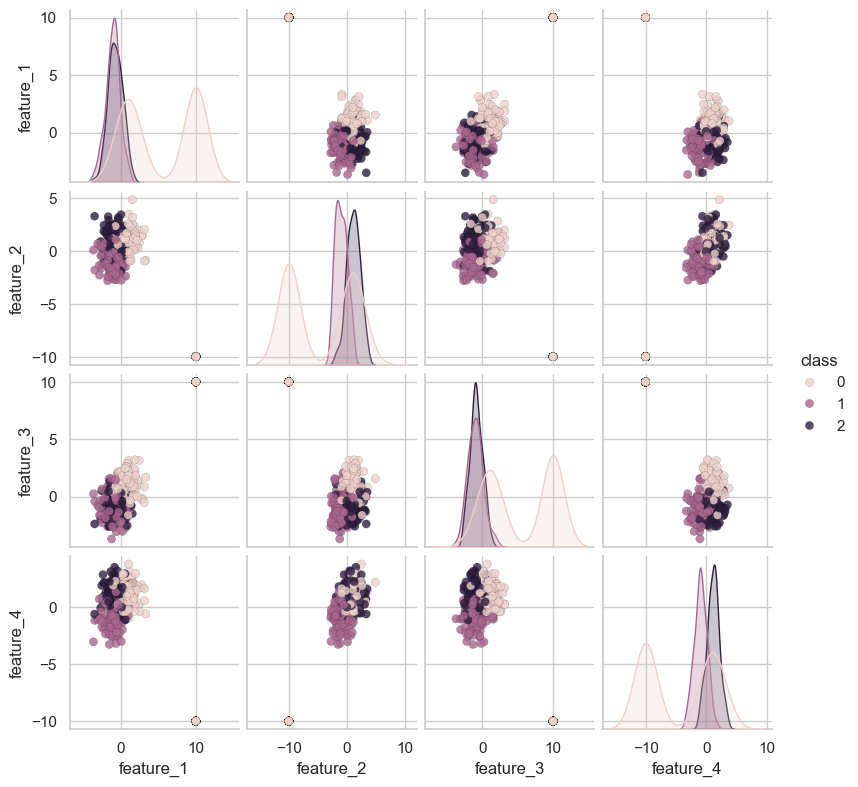

------------------------Dataset with A=100, B=20 created------------------------
------------------------Key df characteristics------------------------
        feature_1   feature_2   feature_3   feature_4       class
count  400.000000  400.000000  400.000000  400.000000  400.000000
mean     4.781905   -4.739617    4.790615   -4.717757    0.750000
std      8.869182    8.907432    8.870575    8.915060    0.830195
min     -3.650970  -20.000000   -3.696887  -20.000000    0.000000
25%     -0.922768   -7.103662   -0.981570   -7.476441    0.000000
50%      0.221961   -0.220898    0.226297   -0.240154    0.500000
75%      7.485994    1.057810    7.392352    1.194783    1.250000
max     20.000000    4.852731   20.000000    3.720169    2.000000
class
0    200
1    100
2    100
Name: count, dtype: int64
------------------------feauture-pair vizualization------------------------


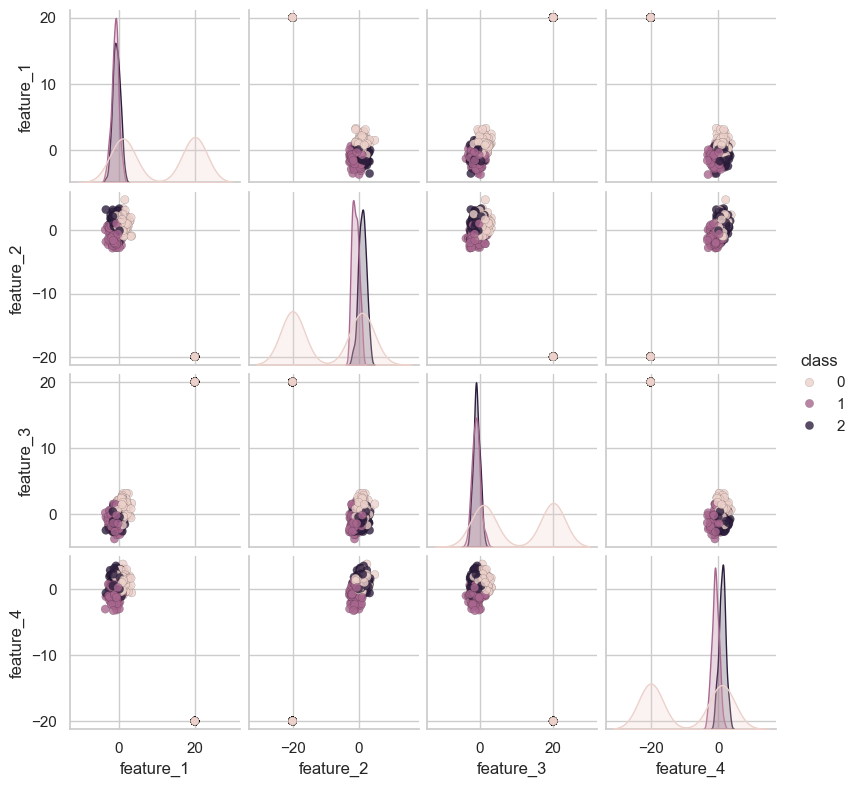

In [6]:
A_values = [1, 10, 100]
B_values = [5, 10, 20]

datasets = {}

for A in A_values:
    for B in B_values:
        additional_points = np.array([[B, -B, B, -B]] * A)
        df_A_B = df.copy()
        additional_df = pd.DataFrame(additional_points, columns=['feature_1', 'feature_2', 'feature_3', 'feature_4'])
        additional_df['class'] = 0
        df_A_B = pd.concat([df_A_B, additional_df], ignore_index=True)
        datasets[(A, B)] = df_A_B
        print(f"------------------------Dataset with A={A}, B={B} created------------------------")
        show_datasets_stats(df_A_B, corr_matrix=False)


[4] Выбрать пару классов (включая класс с повторенными объектами) и один
количественный признак.
Для каждого из датасетов df и df_A_B в своем пространстве Х-Y( количественный
признак-класс) построить и визуализировать объекты, линию линейной регрессии и
линию логистической регрессии. Регрессии строить на паре Х-Y( количественный
признак-класс).
Оценить качество работы полученных на основе логистической регрессии
классификаторов, используя ROC кривые, восстановив на графике ROC кривых
точку классификации Sensitivity-Specificity и доверительные интервалы CI95
бутстрепом (n=1000).
Все полученные графики возможно расположить в две колонки: левая колонка –
визуализация пространства и регрессий, правая – графики с ROC кривой и точкой.


In [ ]:
def show_ROC_CI_plot(dataset):
    bootstrap_iterations = 1000
    colors = ['#ff033e', '#8b00ff', '#f00', '#00f']

    for (A, B), dataframe in dataset.items():
        # Выбираем нужные классы для анализа
        df_selected = dataframe[dataframe['class'].isin([0, 1])]
        X = df_selected[['feature_1']]
        y = df_selected['class']

        lin_reg = LinearRegression().fit(X, y)
        y_pred_lin = lin_reg.predict(X)

        log_reg = LogisticRegression().fit(X, y)
        y_pred_log_proba = log_reg.predict_proba(X)[:, 1]

        x_values = np.sort(X.values.flatten())
        y_pred_log_proba_sorted = log_reg.predict_proba(x_values.reshape(-1, 1))[:, 1]

        threshold = 0.5
        mask_high = y_pred_log_proba_sorted >= threshold
        mask_low = y_pred_log_proba_sorted < threshold

        log_specificity, log_sensitivity, thresholds = roc_curve(y, y_pred_log_proba)
        log_roc_auc = auc(log_specificity, log_sensitivity)

        J = log_sensitivity - log_specificity  # Youden's J statistic
        idx = np.argmax(J)
        best_threshold = thresholds[idx]
        best_sensitivity = log_sensitivity[idx]
        best_specificity = 1 - log_specificity[idx]

        bootstrap_sensitivities = []
        bootstrap_aucs = []

        c = np.where(y == 0, colors[0], colors[1])
        plt.figure(figsize=(16, 4))
        # Regression plot
        plt.subplot(1, 2, 1)
        plt.scatter(X, y, c=c, edgecolor='k')
        plt.plot(x_values, y_pred_log_proba_sorted, label='Logistic Regression', c=colors[2])
        plt.plot(X, y_pred_lin, label='Linear Regression', c=colors[3])
        plt.axvspan(x_values[mask_low].min(), x_values[mask_low].max(), color=colors[0], alpha=0.1)
        plt.axvspan(x_values[mask_high].min(), x_values[mask_high].max(), color=colors[1], alpha=0.1)

        plt.legend()
        plt.title(f"Regression Comparison for A={A} and B={B}")
        plt.xlabel('Feature 1')
        plt.ylabel('Class')
        plt.ylim(-0.05, 1.05)
        plt.xlim(x_values[0] - 0.1, x_values[-1] + 0.1)
        plt.grid(True)

        # ROC and CI plot
        plt.subplot(1, 2, 2)
        plt.scatter(1 - best_specificity, best_sensitivity, color='yellow', edgecolor='black', alpha=0.7,
            label=f"Best Threshold\nSensitivity: {best_sensitivity:.2f}\nSpecificity: {best_specificity:.2f}")

        plt.plot(log_specificity, log_sensitivity, label=f'Logistic Regression (AUC = {log_roc_auc:.4f})', c=colors[2])
        plt.plot([0, 1], [0, 1], 'k--')

        # Bootstrap для доверительного интервала
        for i in range(bootstrap_iterations):
            bootstrap_X, bootstrap_y = resample(X, y, n_samples=len(X))
            log_reg_bs = LogisticRegression().fit(bootstrap_X, bootstrap_y)
            log_reg_bs_pred = log_reg_bs.predict_proba(bootstrap_X)[:, 1]
            spec, sens, _ = roc_curve(bootstrap_y, log_reg_bs_pred)
            bootstrap_sensitivities.append(np.interp(log_specificity, spec, sens))

            # Рассчитываем AUC для каждой бутстрэп-выборки
            bootstrap_auc = auc(spec, sens)
            bootstrap_aucs.append(bootstrap_auc)

        # Доверительный интервал для чувствительности
        mean_sens = np.mean(bootstrap_sensitivities, axis=0)
        std_sens = np.std(bootstrap_sensitivities, axis=0)
        z = 1.96  # для 95% доверительного интервала
        plt.fill_between(log_specificity, mean_sens - z * std_sens, mean_sens + z * std_sens, color='black', alpha=0.1, label='95% CI')

        # Доверительный интервал для AUC
        mean_auc = np.mean(bootstrap_aucs)
        std_auc = np.std(bootstrap_aucs)
        plt.fill_betweenx([0, 1], mean_auc - z * std_auc, mean_auc + z * std_auc, color='green', alpha=0.1, label=f'AUC CI: {mean_auc:.4f} ± {z * std_auc:.4f}')

        plt.title(f"ROC Curve for A={A} and B={B}")
        plt.xlabel("1 - Specificity")
        plt.ylabel("Sensitivity")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

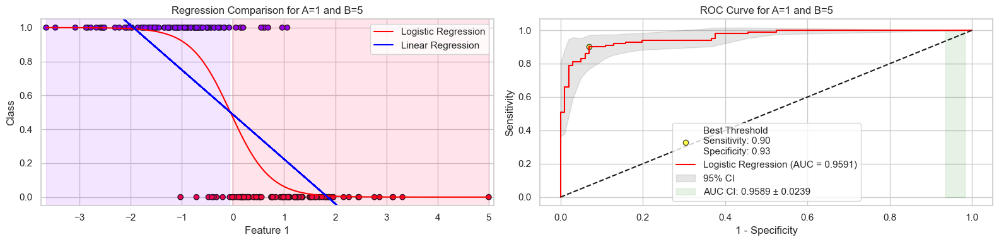

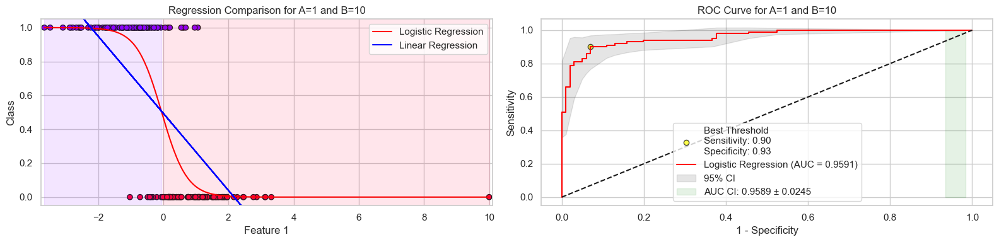

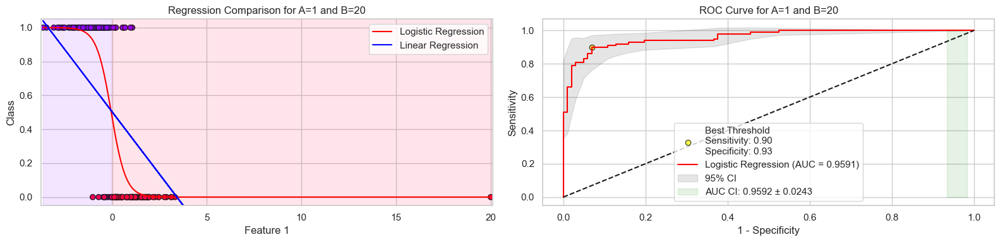

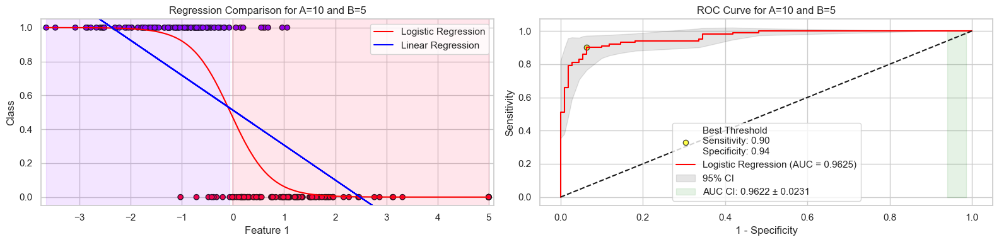

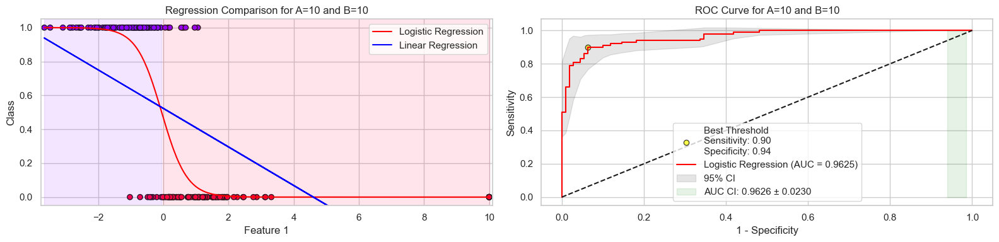

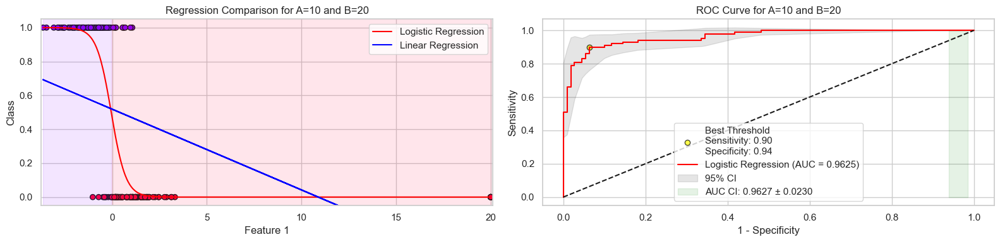

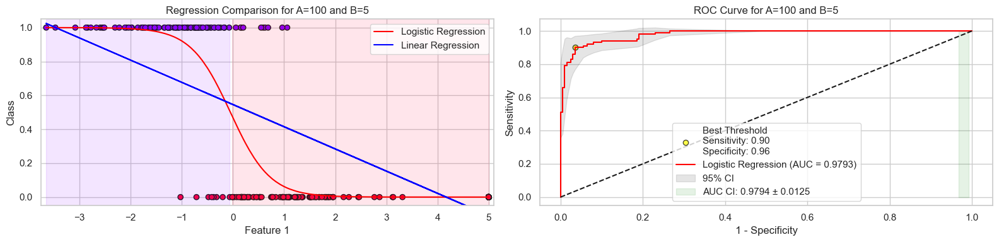

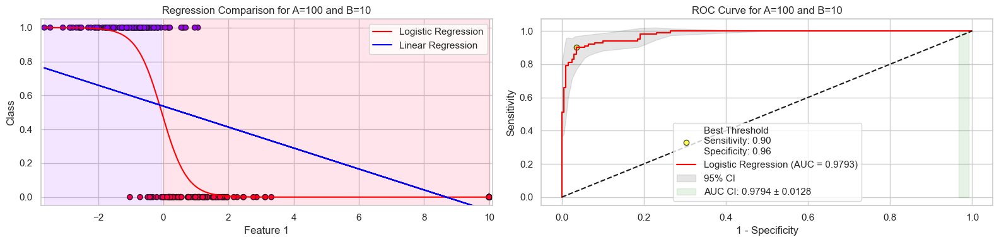

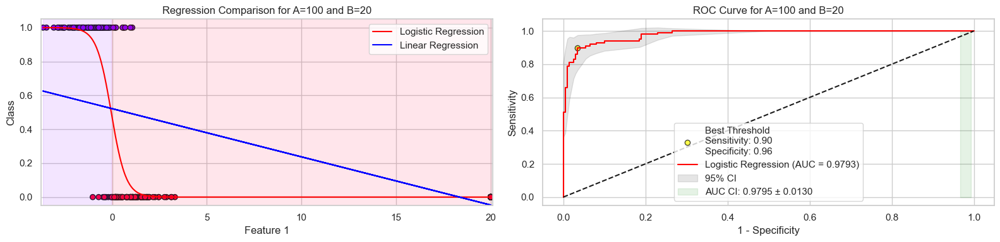

In [56]:
show_ROC_CI_plot(datasets)

In [61]:
log_datasets = {}

for (A, B), dataframe in datasets.items():
    df_selected = dataframe[dataframe['class'].isin([0, 1])]
    X = df_selected.drop(columns='class')
    y = df_selected['class']

    lin_reg_multi = LinearRegression().fit(X, y)
    y_pred_multi = lin_reg_multi.predict(X)

    log_df = pd.DataFrame({
        'feature_1': y_pred_multi,
        'class': y
    })
    log_datasets[(A, B)] = log_df

    # print(f"Coefficients for A={A}, B={B}: {lin_reg_multi.coef_}")
    # print(f"Intercept for A={A}, B={B}: {lin_reg_multi.intercept_}")

# Создаем аналогичный датасет для исходного df
X = df[df['class'].isin([0, 1])].drop(columns='class')
y = df[df['class'].isin([0, 1])]['class']

lin_reg_multi = LinearRegression().fit(X, y)
y_pred_multi = lin_reg_multi.predict(X)

log_df = pd.DataFrame({
    'feature_1': y_pred_multi,
    'class': y
})

log_datasets[(0, 0)] = log_df
print("Coefficients for original df:", lin_reg_multi.coef_)
print("Intercept for original df:", lin_reg_multi.intercept_)

# print(log_datasets.keys())

Coefficients for original df: [-0.13014182 -0.10075836 -0.08422998 -0.07899481]
Intercept for original df: 0.4941543881757227


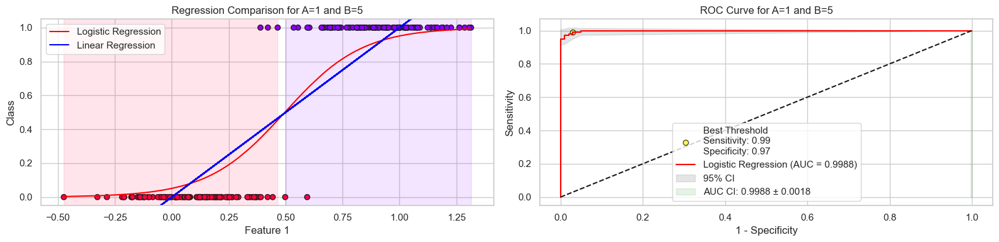

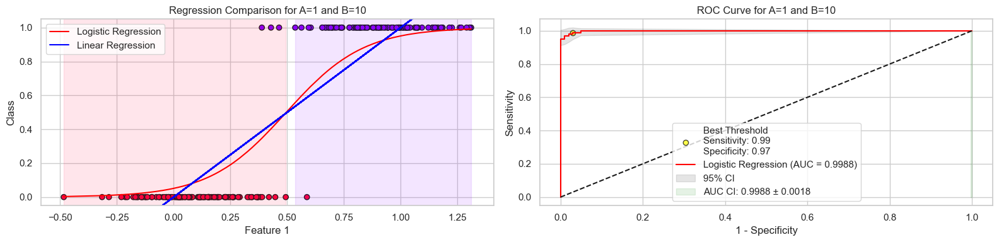

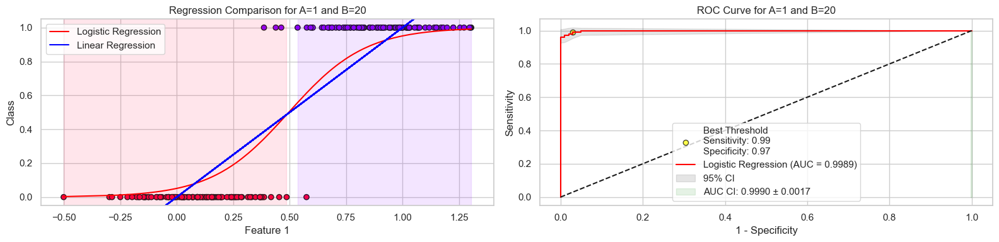

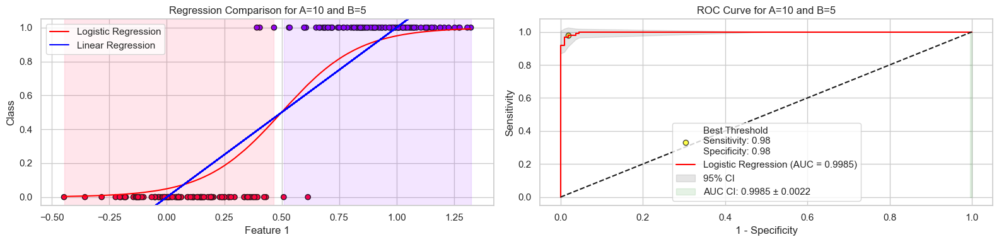

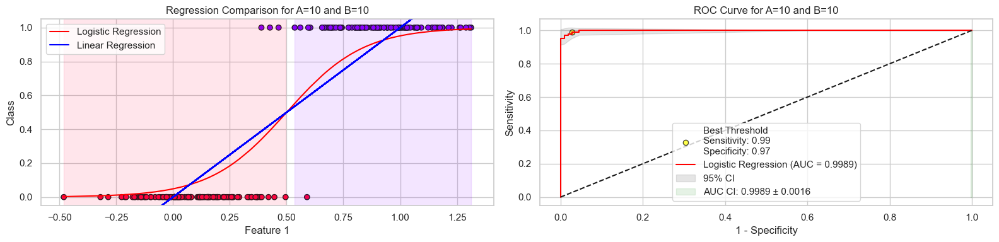

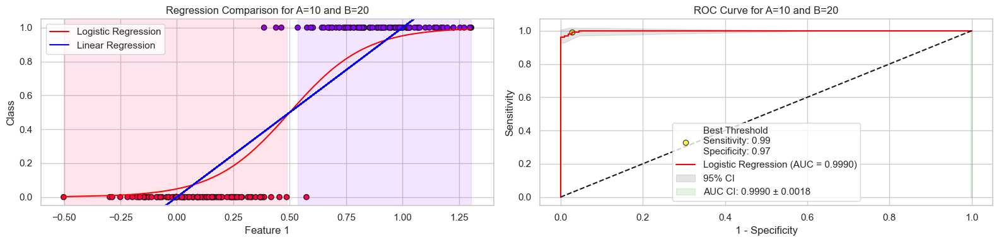

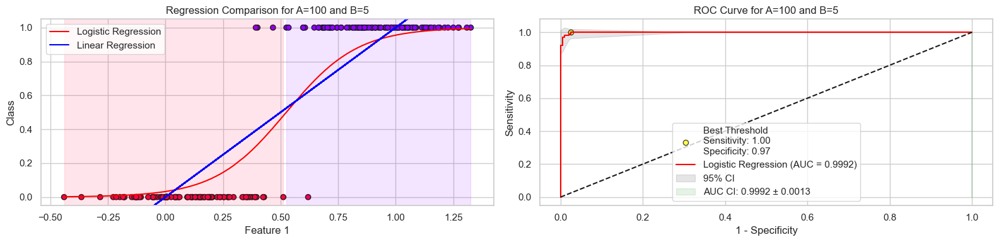

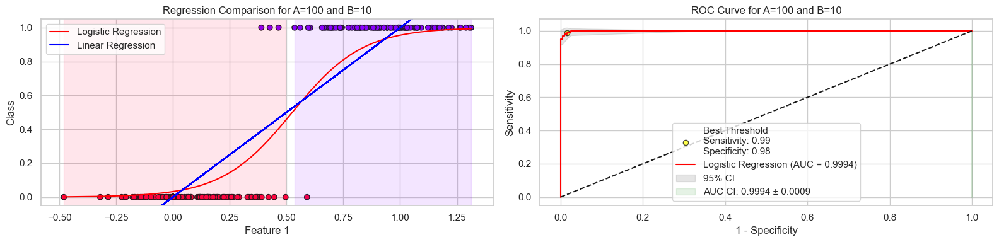

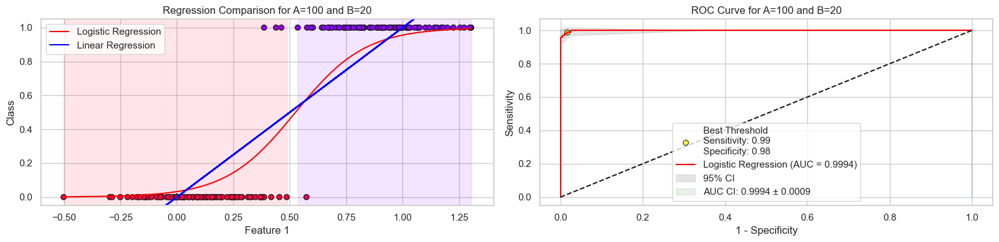

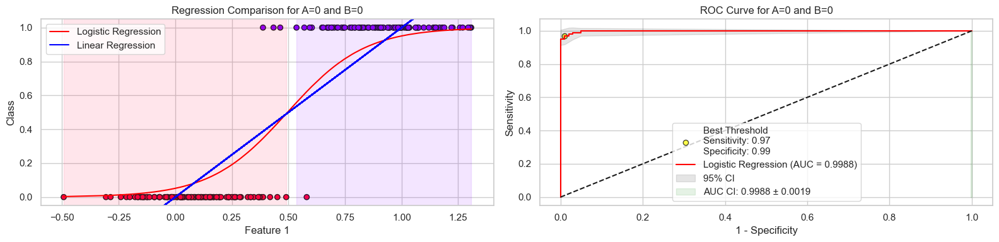

In [60]:
show_ROC_CI_plot(log_datasets)

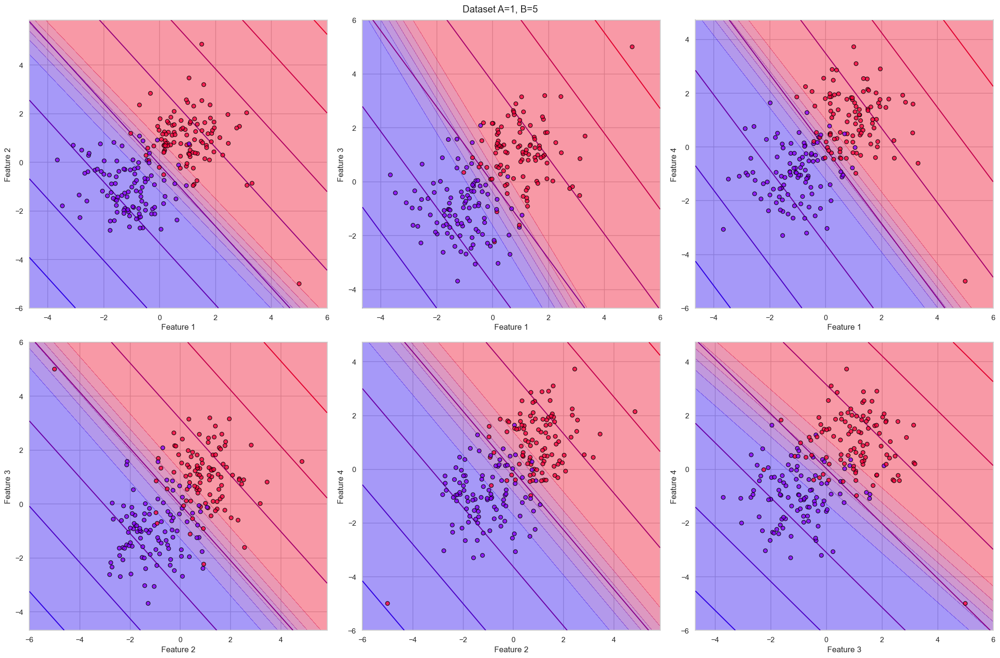

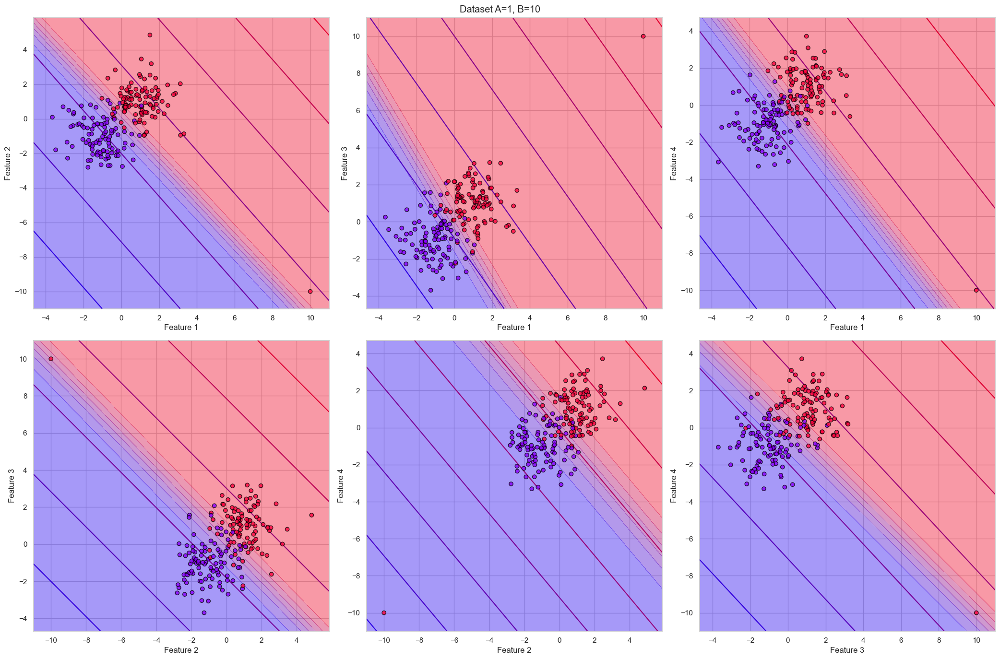

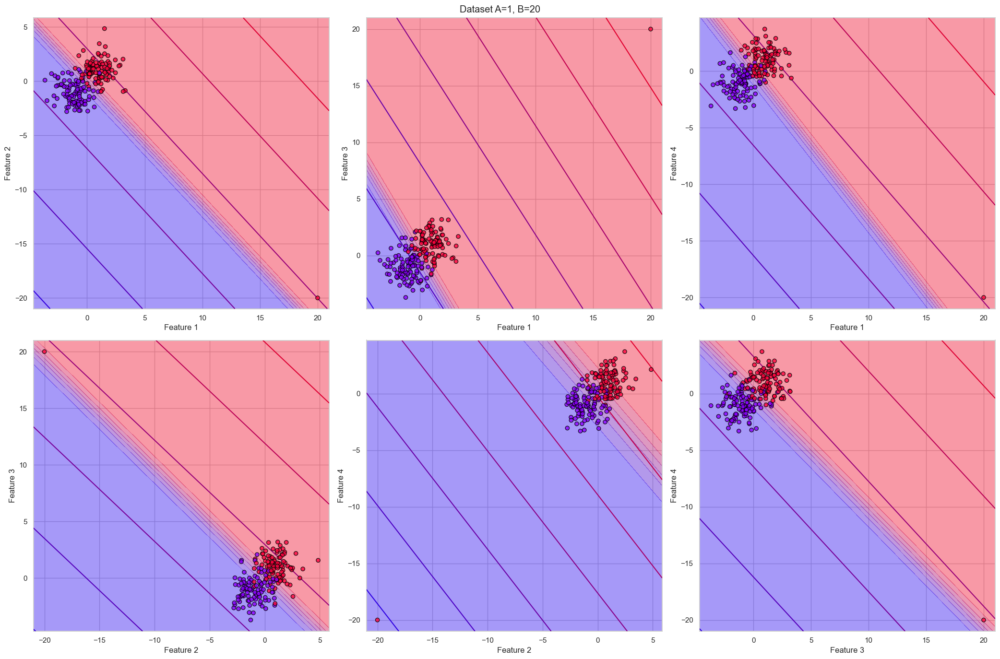

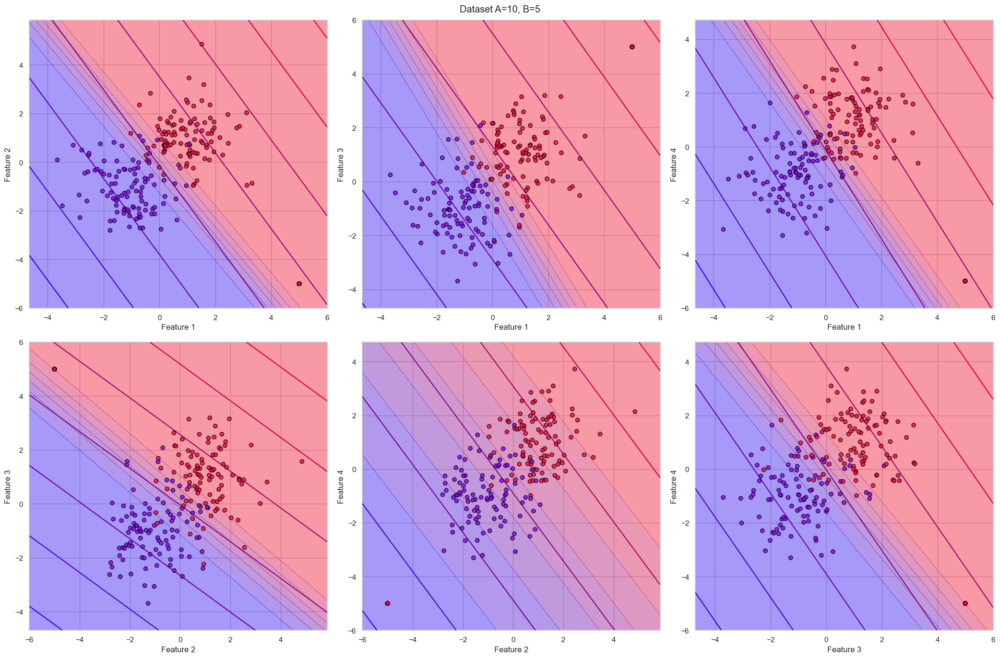

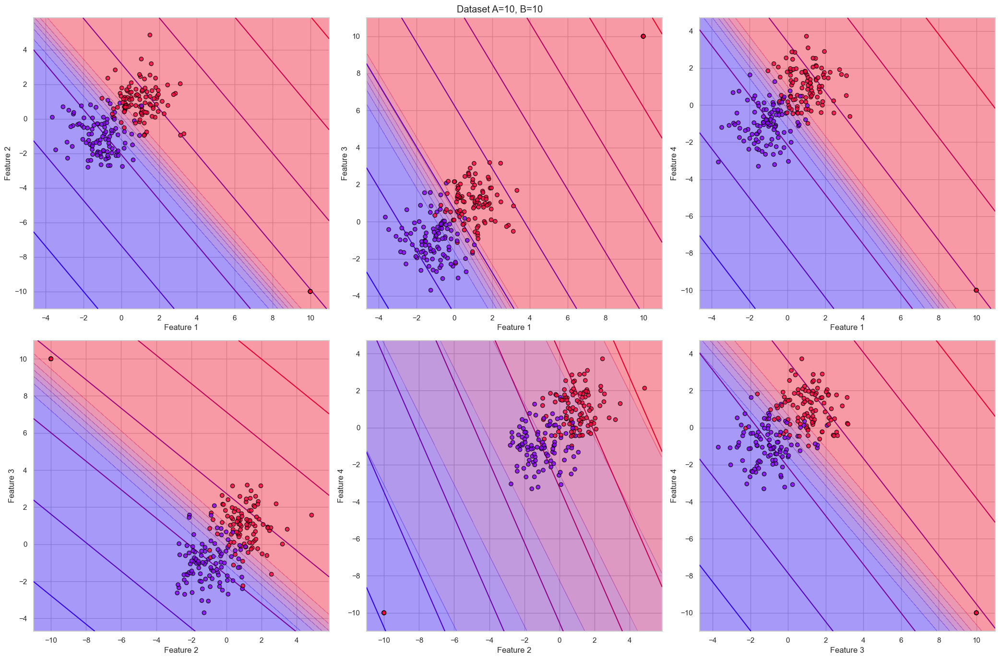

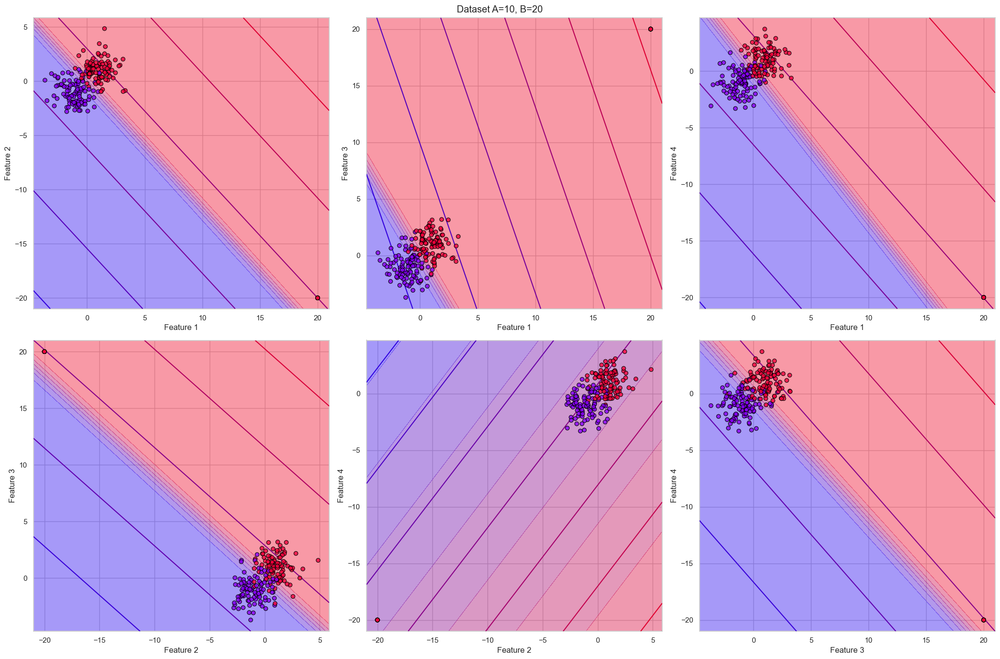

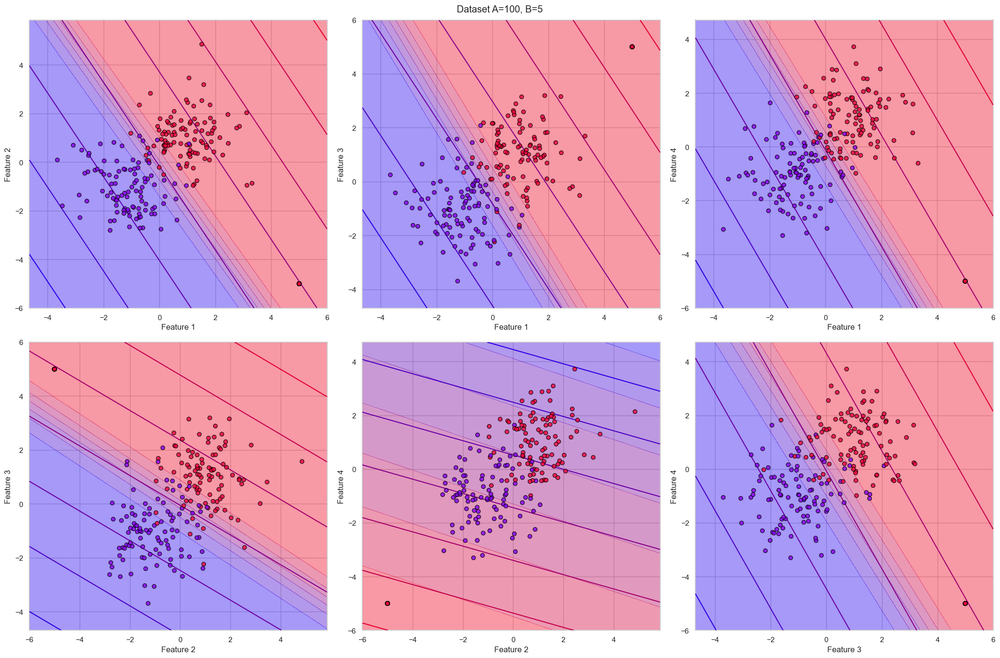

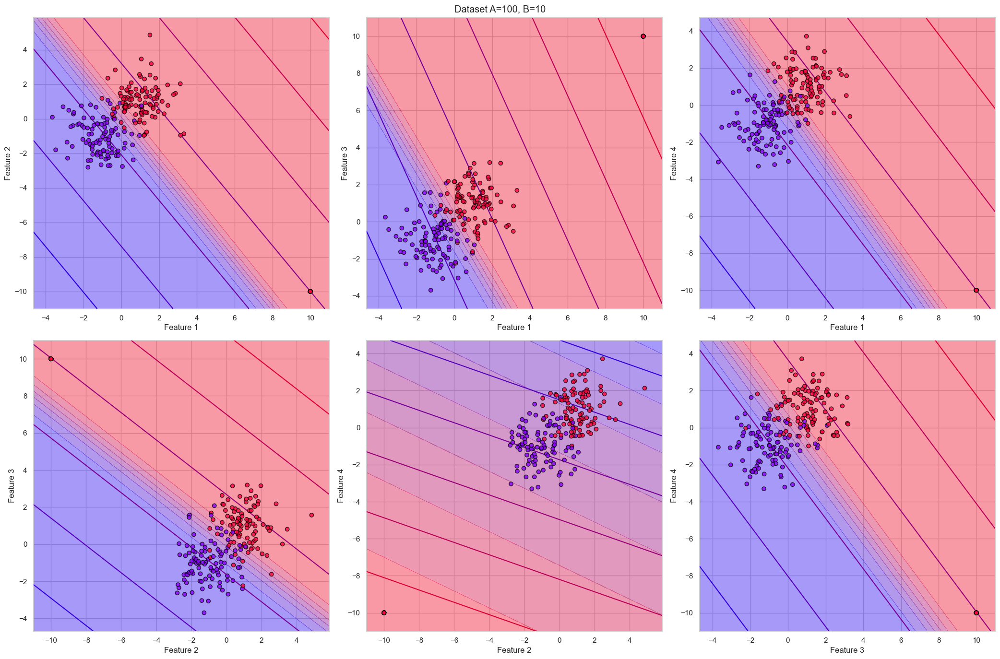

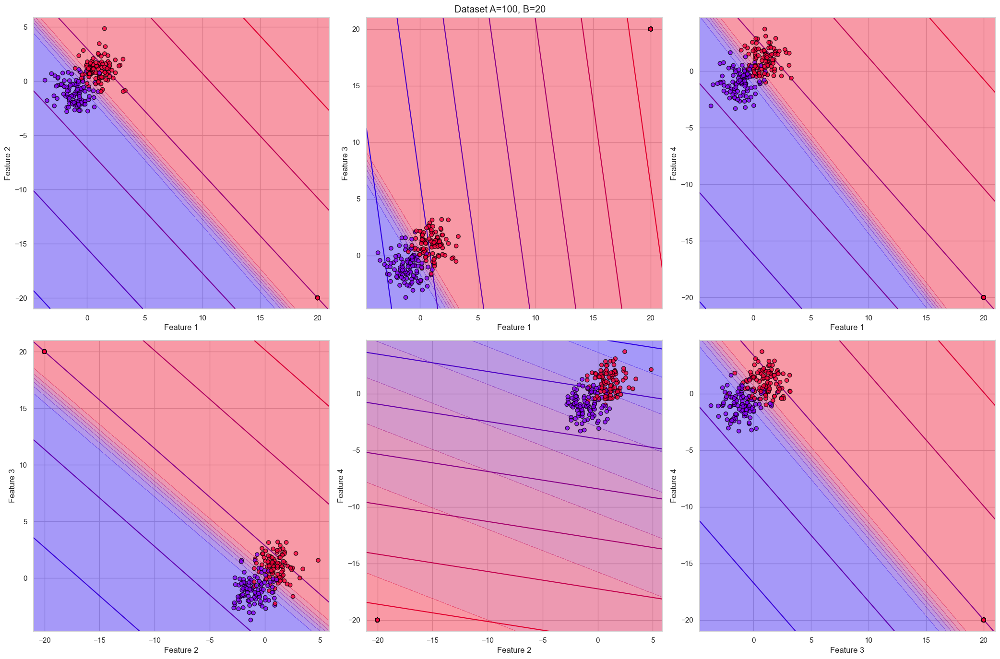

In [105]:
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap


mycmap = LinearSegmentedColormap.from_list("custom_gradient", ['#f01', '#10f'])

for (A, B), dataframe in datasets.items():
    selected_df = dataframe[dataframe['class'].isin([0, 1])]
    X = selected_df[['feature_1']]
    y = selected_df['class']

    all_pairs = list(combinations([1, 2, 3, 4], 2))
    selected_classes = [0, 1]

    fig, axs = plt.subplots(nrows=2, ncols=len(all_pairs) // 2, figsize=(21, 14))
    width = len(all_pairs) // 2
    fig.suptitle(f"Dataset A={A}, B={B}")

    # Преобразуем axs в массив для удобной индексации
    axs = np.array(axs).reshape(2, width)

    for p, pair in enumerate(all_pairs):
        p2 = p % width  # Столбец
        p1 = p // width  # Строка

        # Извлекаем признаки для текущей пары
        feature = selected_df.iloc[:, [pair[0] - 1, pair[1] - 1]].values
        label = selected_df['class'].values

        # Фильтруем по выбранным классам
        current_classes_mask = np.isin(label, selected_classes)
        feature = feature[current_classes_mask]
        label = label[current_classes_mask]

        x_min, x_max = feature[:, 0].min() - 1, feature[:, 0].max() + 1
        y_min, y_max = feature[:, 1].min() - 1, feature[:, 1].max() + 1

        scatter = axs[p1, p2].scatter(feature[:, 0], feature[:, 1], alpha=0.8, c=label, cmap=plt.cm.colors.ListedColormap(['#ff033e', '#8b00ff']), edgecolor='black', zorder=5)

        lin_reg = LinearRegression().fit(feature, label)
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        Z = lin_reg.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
        axs[p1, p2].contour(xx, yy, Z, alpha=1, cmap=mycmap, zorder=4)

        log_reg = LogisticRegression().fit(feature, label)
        Z = log_reg.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1].reshape(100, 100)
        axs[p1, p2].contourf(xx, yy, Z, alpha=0.4, cmap=mycmap, linestyles='dashed', zorder=1)

        # Названия осей
        axs[p1, p2].set_xlabel(f"Feature {pair[0]}")
        axs[p1, p2].set_ylabel(f"Feature {pair[1]}")

    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()
